<a href="https://colab.research.google.com/github/maxmarkov/track_and_count/blob/master/urn_detection_yolov5/YOLOv5_urn_detection_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Detection of voting box with YOLOv5.

To train our detector we take the following steps:

* Install YOLOv5 dependencies
* Download custom YOLOv5 object detection data
* Write our YOLOv5 Training configuration
* Run YOLOv5 training
* Evaluate YOLOv5 performance
* Visualize YOLOv5 training data
* Run YOLOv5 inference on test images
* Export saved YOLOv5 weights for future inference




#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [30]:
#%rm -rf yolov5 adc.json
%ls

sample_data/


In [31]:
# import libraries
import os
import torch
from IPython.display import Image, clear_output  # to display images

%cd /content
# installation 
if not os.path.exists('yolov5'):
  !git clone https://github.com/ultralytics/yolov5
  !pip install -r yolov5/requirements.txt  --quiet  # install dependencies
  #clear_output()

%cd yolov5
from utils.google_utils import attempt_download, gdrive_download   # to download models/datasets
print(os.listdir('./')) 
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 4, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 2615 (delta 1), reused 1 (delta 0), pack-reused 2611
Receiving objects: 100% (2615/2615), 5.39 MiB | 33.85 MiB/s, done.
Resolving deltas: 100% (1719/1719), done.
/content/yolov5
['.gitattributes', '.github', 'requirements.txt', 'train.py', 'Dockerfile', 'sotabench.py', 'LICENSE', 'utils', 'README.md', 'test.py', '.dockerignore', 'models', 'tutorial.ipynb', 'weights', 'hubconf.py', 'detect.py', '.gitignore', '.git', 'inference', 'data']
Setup complete. Using torch 1.6.0+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15079MB, multi_processor_count=40)


# Download Custom Dataset 

We download our dataset from Roboflow using the "**YOLOv5 PyTorch**" export format. To get your data into Roboflow, follow the [Getting Started Guide](https://blog.roboflow.ai/getting-started-with-roboflow/).

In [32]:
# i generated urn dataset and used save in programatic style option to get the link to the dataset
#%cd /content
if not os.path.exists('data.yaml'):
  !curl -L "https://app.roboflow.ai/ds/SESRKBTPJ8?key=P0A7b9KUtr" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
  clear_output()
os.listdir('./')

['.gitattributes',
 '.github',
 'requirements.txt',
 'train.py',
 'Dockerfile',
 'README.roboflow.txt',
 'sotabench.py',
 'LICENSE',
 'utils',
 'README.md',
 'test.py',
 '.dockerignore',
 'models',
 'tutorial.ipynb',
 'valid',
 'weights',
 'hubconf.py',
 'data.yaml',
 'detect.py',
 '.gitignore',
 'train',
 '.git',
 'inference',
 'test',
 'data']

In [33]:
%ls

data/       hubconf.py  README.md*           test/     tutorial.ipynb
data.yaml   inference/  README.roboflow.txt  test.py   utils/
detect.py   LICENSE     requirements.txt*    train/    valid/
Dockerfile  models/     sotabench.py         train.py  weights/


'data.yaml' file defines where your training and validation sets are stored

In [34]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['urn']

# Define Model Configuration and Architecture

We write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer. Uncomment if you want to add a 'person' class.

In [35]:
%ls

data/       hubconf.py  README.md*           test/     tutorial.ipynb
data.yaml   inference/  README.roboflow.txt  test.py   utils/
detect.py   LICENSE     requirements.txt*    train/    valid/
Dockerfile  models/     sotabench.py         train.py  weights/


In [36]:
# define number of classes based on YAML
import yaml

with open("data.yaml", 'r') as stream:
  yaml_dict = yaml.safe_load(stream)

num_classes = yaml_dict['nc']#+1
names_classes = yaml_dict['names']#.append('person')
#names_classes.append('person')

print('Number of classes:', num_classes)  
print('Names of classes:', names_classes)

Number of classes: 1
Names of classes: ['urn']


### Write a custom model yaml file

In [37]:
#you can configure this based on other YOLOv5 models in the models directory
with open('data/urn.yaml', 'w') as f:
  # parameters
  f.write('train: train/images'+ '\n')  
  f.write('test: test/images'+ '\n')
  f.write('val: valid/images'+ '\n')    
  f.write('nc: ' + str(num_classes) + '\n')
  f.write('names: ' + str(names_classes)  + '\n')

In [38]:
%cat data/urn.yaml

train: train/images
test: test/images
val: valid/images
nc: 1
names: ['urn']


### Download a Model, pretrained weights and video files for inference.

Choose the pre-trained weights: standard from yolov5s or already pretrained.

In [39]:
!pip install -U -q PyDrive ## you will have install for every colab session
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# 1. Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# 2. Download file content as local files.
# Model. change number of classes to the one in the custom data set.
!sed -i 's/nc: 80/nc: 1/g' models/yolov5s.yaml

# pretrained weights
weights_mode = 'standard'
if weights_mode == 'updated':
  weights_pt = drive.CreateFile({'id':'1R5T6rIyy3lLwgFXNms8whc-387H0tMQO'})
  weights_pt.GetContentFile('weights/yolov5s_robo.pt')
else:
  attempt_download('weights/yolov5s.pt')
  #%cp yolov5s.pt yolov5/

%mkdir video

# video file 1
test_video_file_1 = drive.CreateFile({'id':'1Yy7lR-SFFsJU5lqVWXOgNXkQUgnH1TyE'})
test_video_file_1.GetContentFile('video/test_video.mp4')

# video file 2
test_video_file_2 = drive.CreateFile({'id':'1tmVAgNoX2hZ2HdqDUUd_CgJjtGbcJmvw'})
test_video_file_2.GetContentFile('video/test_video_1.mp4')

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights.
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [40]:
%ls

data/       hubconf.py  README.md*           test/     tutorial.ipynb  weights/
data.yaml   inference/  README.roboflow.txt  test.py   utils/
detect.py   LICENSE     requirements.txt*    train/    valid/
Dockerfile  models/     sotabench.py         train.py  video/


In [41]:
%time # time the model performance

# train yolov5s on custom data for 100 epochs
!python train.py --img 416 --batch 16 --epochs 100 --data 'data/urn.yaml' --cfg 'models/yolov5s.yaml' --weights 'weights/yolov5s.pt' --name urn_detection --cache

CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 7.39 µs
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='models/yolov5s.yaml', data='data/urn.yaml', device='', epochs=100, evolve=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], local_rank=-1, logdir='runs/', multi_scale=False, name='urn_detection', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=16, weights='weights/yolov5s.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
2020-10-06 22:56:36.760003: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8,

# Evaluate Custom YOLOv5 Detector Performance

In [42]:
%cd runs/exp0_urn_detection

/content/yolov5/runs/exp0_urn_detection


Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes. Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [43]:
# Start tensorboard. Logs save in the folder "runs".
%reload_ext tensorboard
%tensorboard --logdir ./

Reusing TensorBoard on port 6006 (pid 462), started 1:03:35 ago. (Use '!kill 462' to kill it.)

<IPython.core.display.Javascript object>

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

In [44]:
import glob
glob.glob('*.jpg')

['train_batch2.jpg',
 'train_batch0.jpg',
 'test_batch0_pred.jpg',
 'test_batch0_gt.jpg',
 'train_batch1.jpg']

GROUND TRUTH TRAINING DATA:


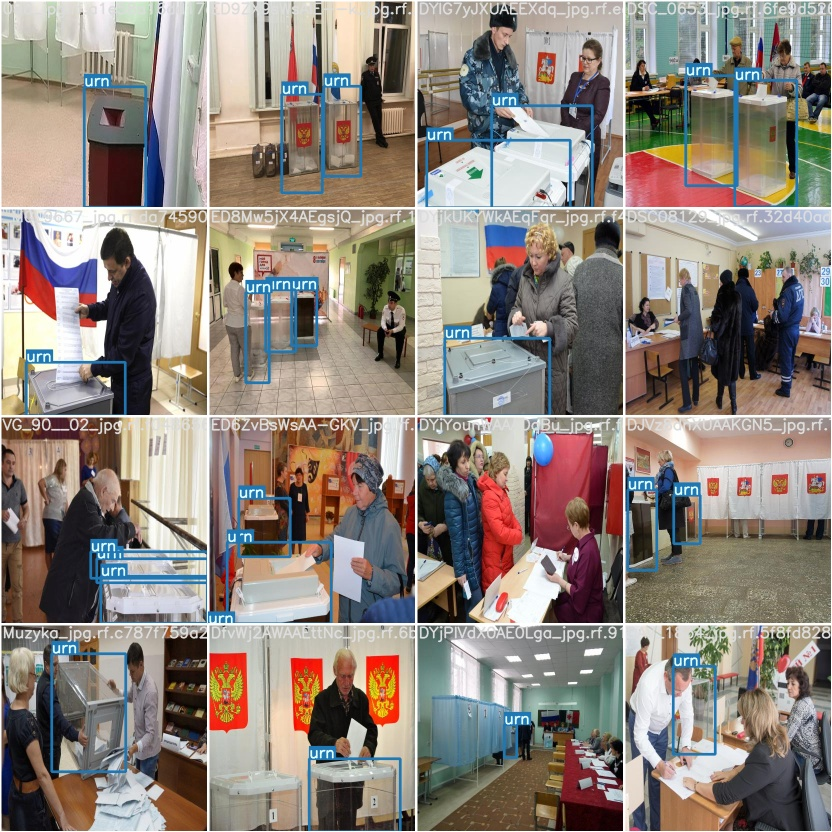

In [45]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='test_batch0_gt.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


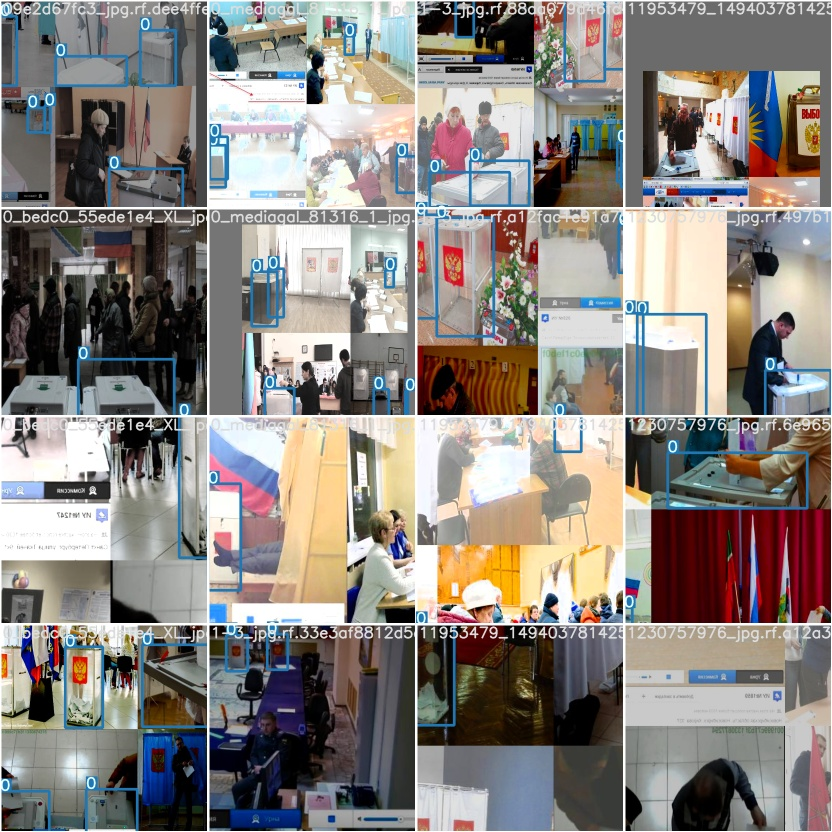

In [46]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='./train_batch2.jpg', width=900)

Download the best weights.

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [47]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
!python ../../detect.py --weights 'weights/best.pt' --img 416 --conf 0.4 --source ../../test/images

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=416, iou_thres=0.5, output='inference/output', save_txt=False, source='../../test/images', update=False, view_img=False, weights=['weights/best.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Fusing layers... 
Model Summary: 191 layers, 7.25509e+06 parameters, 0 gradients
image 1/42 /content/yolov5/test/images/%D0%BF%D0%B0%D1%80%D0%B0%D0%BC%D0%BE%D0%BD%D0%BE%D_jpg.rf.8484d5bcaa09b4f1d967ac22bbf44516.jpg: 416x416 2 urns, Done. (0.013s)
image 2/42 /content/yolov5/test/images/0c48f59228203ee49777d301a71e0dd1_jpg.rf.b01b0c6a6dffbdb77a064a8e6ce9f3cc.jpg: 416x416 1 urns, Done. (0.013s)
image 3/42 /content/yolov5/test/images/1583392751_2039523313_720-480_jpg.rf.c3c9b80027620a615a798107a073b193.jpg: 416x416 1 urns, Done. (0.012s)
image 4/42 /content/yolov5/test/images/1733664368_jpg.rf.f5ffad0aaa07b6e7ba067f50a9bef76b.jpg: 416x416 2 urns, Done. (0.013s)
image 5/

Show example of inference

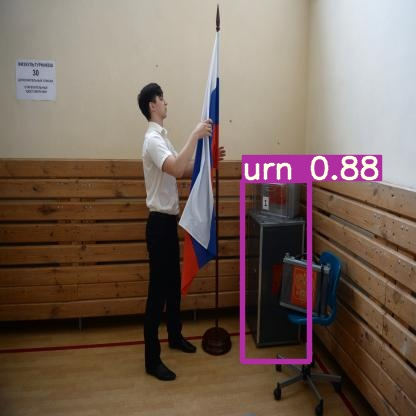

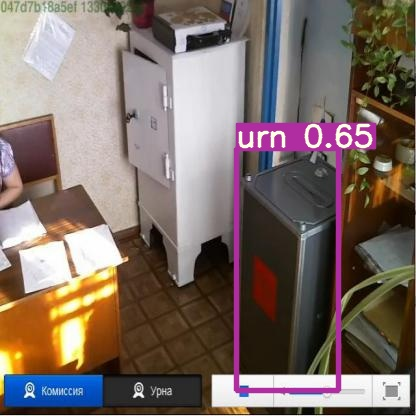

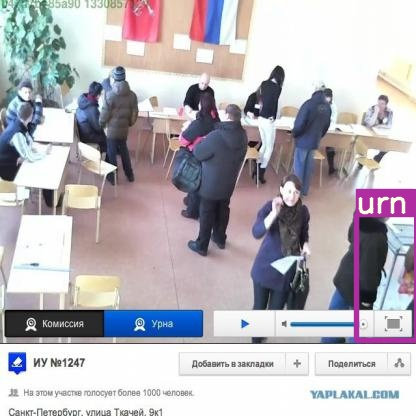

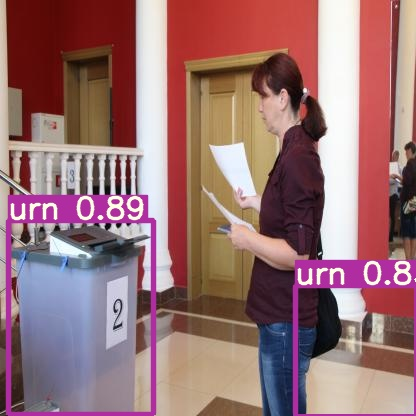

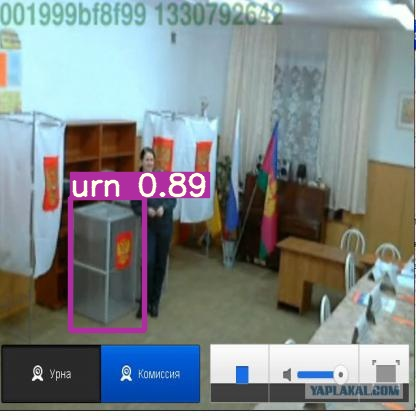

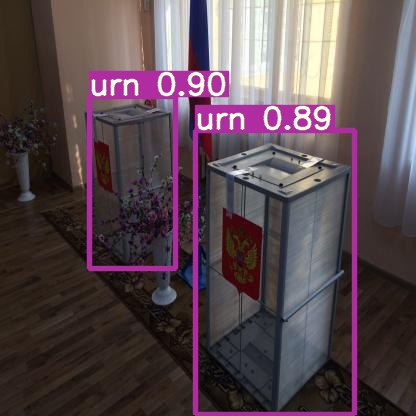

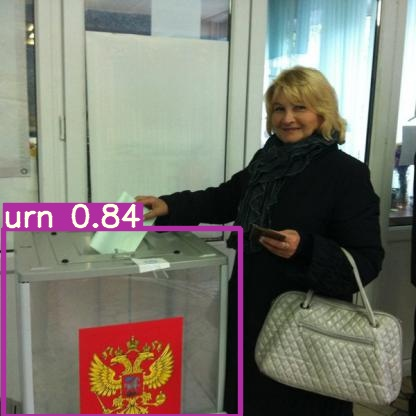

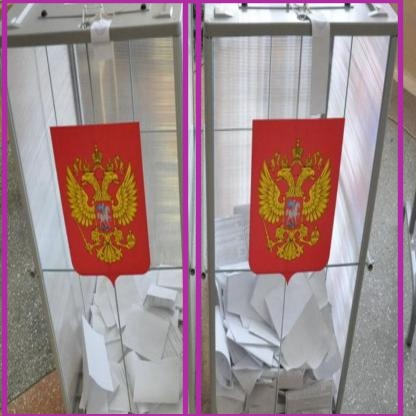

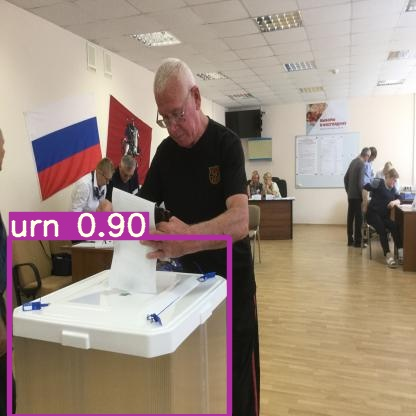

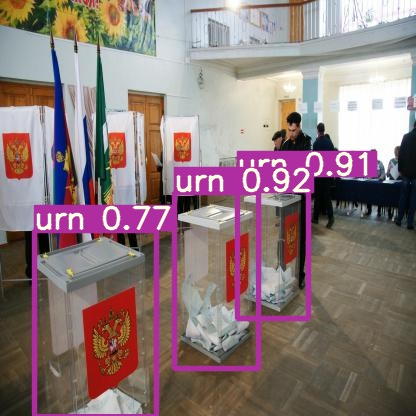

In [48]:
#display inference on ALL test images
from IPython.display import Image, display

for imageName in glob.glob('inference/output/*.jpg')[0:10]: #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Test on video sample

In [49]:
# do detection on sample video 
!python ../../detect.py --source ../../video/test_video.mp4  --weights weights/best.pt --conf 0.4 --classes 0

Streaming output truncated to the last 5000 lines.
video 1/1 (36115/41111) /content/yolov5/video/test_video.mp4: 576x640 Done. (0.009s)
video 1/1 (36116/41111) /content/yolov5/video/test_video.mp4: 576x640 Done. (0.012s)
video 1/1 (36117/41111) /content/yolov5/video/test_video.mp4: 576x640 Done. (0.011s)
video 1/1 (36118/41111) /content/yolov5/video/test_video.mp4: 576x640 Done. (0.011s)
video 1/1 (36119/41111) /content/yolov5/video/test_video.mp4: 576x640 Done. (0.015s)
video 1/1 (36120/41111) /content/yolov5/video/test_video.mp4: 576x640 Done. (0.013s)
video 1/1 (36121/41111) /content/yolov5/video/test_video.mp4: 576x640 Done. (0.011s)
video 1/1 (36122/41111) /content/yolov5/video/test_video.mp4: 576x640 Done. (0.011s)
video 1/1 (36123/41111) /content/yolov5/video/test_video.mp4: 576x640 Done. (0.011s)
video 1/1 (36124/41111) /content/yolov5/video/test_video.mp4: 576x640 Done. (0.011s)
video 1/1 (36125/41111) /content/yolov5/video/test_video.mp4: 576x640 Done. (0.011s)
video 1/1 (361

Play video with inference in colab. It might fail in Firefox with 'No video with supported format and MIME type found' error. We download the video below along with the weights.

In [50]:
from IPython.display import HTML
from base64 import b64encode
video_path = '/content/yolov5/runs/exp0_urn_detection/inference/output/test_video.mp4'

mp4 = open(video_path,'rb').read()
decoded_vid = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f'<video width=400 controls><source src={decoded_vid} type="video/mp4"></video>')

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [52]:
from google.colab import files
files.download('/content/yolov5/runs/exp0_urn_detection/weights/best.pt') # weights file 14 Mb
files.download('/content/yolov5/runs/exp0_urn_detection/inference/output/test_video.mp4') # video 150 Mb

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Congrats!